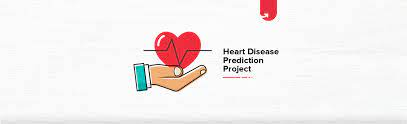

**Heart Disease Prediction:**


**1) Problem Statement**

---




**Let's imagine you are a doctor. You have to diagnose the patient and determine if he has heart disease. In that case, two things will be very important:**

*  If it is heart disease, it should not be judged as normal. An undiagnosed heart disease should not lead to an accident that prevents the patient from receiving appropriate treatment.  
*   In other words, recall becomes a very important metric.
Diagnosis results should be well explained in a way that the patient can understand. In other words, you should be able to logically explain to the patient which features influenced your decision.

**Data Set Information:**
Our "goal" predict the presence of heart disease in the patient.The Data Set contains 12 columns or features through which we need to detect the heart Disease.

**Source:**
Dataset from : https://www.kaggle.com/

**2) Features**

---

**Age:** age of the patient [years]

**Sex:** sex of the patient [M: Male, F: Female]

**ChestPainType:** chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]

**RestingBP:** resting blood pressure [mm Hg]

**Cholesterol:** serum cholesterol [mm/dl]

**FastingBS:** fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]

**RestingECG:** resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]

**MaxHR:** maximum heart rate achieved [Numeric value between 60 and 202]

**ExerciseAngina:**exercise-induced angina [Y: Yes, N: No]

**Oldpeak:** oldpeak = ST [Numeric value measured in depression]

**ST_Slope:** the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]

**HeartDisease:** output class [1: heart disease, 0: Normal]

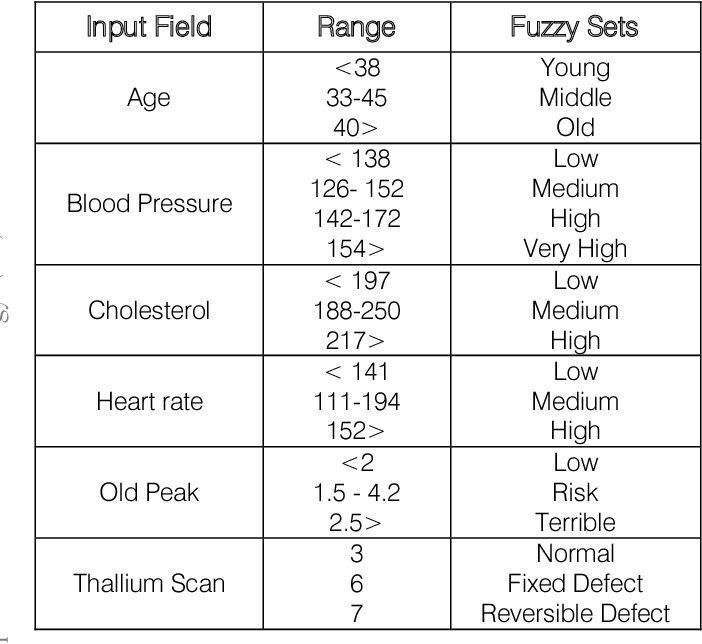

**3)Installing and Importing liberaries**

In [ ]:
!pip install -q datascience                   # Package that is required by pandas profiling
!pip install -q pandas-profiling              # Library to generate basic statistics about data

In [ ]:
!pip install -q --upgrade pandas-profiling

In [ ]:
#-------------------------------------------------------------------------------------------------------------------------------
import pandas as pd                                                 # Importing for panel data analysis
from pandas_profiling import ProfileReport                          # Import Pandas Profiling (To generate Univariate Analysis) 
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high      
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity      
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)         # To suppress scientific notation over exponential values
#-------------------------------------------------------------------------------------------------------------------------------
import numpy as np                                                  # Importing package numpys (For Numerical Python)
#-------------------------------------------------------------------------------------------------------------------------------
import matplotlib.pyplot as plt                                     # Importing pyplot interface using matplotlib
from matplotlib.pylab import rcParams                               # Backend used for rendering and GUI integration                                               
import seaborn as sns                                               # Importin seaborm library for interactive visualization
%matplotlib inline
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.metrics import accuracy_score                          # For calculating the accuracy for the model
from sklearn.metrics import precision_score                         # For calculating the Precision of the model
from sklearn.metrics import recall_score                            # For calculating the recall of the model
from sklearn.metrics import precision_recall_curve                  # For precision and recall metric estimation
from sklearn.metrics import confusion_matrix                        # For verifying model performance using confusion matrix
from sklearn.metrics import f1_score                                # For Checking the F1-Score of our model  
from sklearn.metrics import roc_curve                               # For Roc-Auc metric estimation
#-------------------------------------------------------------------------------------------------------------------------------
from sklearn.model_selection import train_test_split                # To split the data in training and testing part     
from sklearn.linear_model import LogisticRegression                 # To create the Logistic Regression Model
#-------------------------------------------------------------------------------------------------------------------------------
import warnings                                                     # Importing warning to disable runtime warnings
warnings.filterwarnings("ignore")                                   # Warnings will appear only once

In [ ]:
from sklearn.metrics import log_loss, roc_auc_score, recall_score, precision_score, average_precision_score, f1_score, classification_report, accuracy_score, plot_roc_curve, plot_precision_recall_curve, plot_confusion_matrix


In [ ]:
from google.colab import files
  
  
uploaded = files.upload()

Saving heart dataset final.csv to heart dataset final (1).csv


**4) Data Acquisition & Description**

In [ ]:
import pandas as pd
import io
  
heart_df = pd.read_csv(io.BytesIO(uploaded['heart dataset final.csv']))
print(heart_df.head())

   Age Sex ChestPainType  RestingBP  Cholesterol  FastingBS RestingECG  MaxHR  \
0   40   M           ATA        140          289          0     Normal    172   
1   49   F           NAP        160          180          0     Normal    156   
2   37   M           ATA        130          283          0         ST     98   
3   48   F           ASY        138          214          0     Normal    108   
4   54   M           NAP        150          195          0     Normal    122   

  ExerciseAngina  Oldpeak ST_Slope  HeartDisease  
0              N  0.00000       Up             0  
1              N  1.00000     Flat             1  
2              N  0.00000       Up             0  
3              Y  1.50000     Flat             1  
4              N  0.00000       Up             0  


In [ ]:
heart_df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.00000,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.00000,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.00000,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.50000,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.00000,Up,0


In [ ]:
heart_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [ ]:
heart_df.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.00000,918.00000,918.00000,918.00000,918.00000,918.00000,918.00000
mean,53.51089,132.39651,198.79956,0.23312,136.80937,0.88736,0.55338
std,9.43262,18.51415,109.38414,0.42305,25.46033,1.06657,0.49741
min,28.00000,0.00000,0.00000,0.00000,60.00000,-2.60000,0.00000
25%,47.00000,120.00000,173.25000,0.00000,120.00000,0.00000,0.00000
50%,54.00000,130.00000,223.00000,0.00000,138.00000,0.60000,1.00000
75%,60.00000,140.00000,267.00000,0.00000,156.00000,1.50000,1.00000
max,77.00000,200.00000,603.00000,1.00000,202.00000,6.20000,1.00000


**Observations**

---

*   No missing values in any column
*   1 float column,5 object column and 6 interger column
*   12 column and 918 rows
*   Data seems to be in normal distribution
*   Min age is 28 and max  is 77.
*   oldpeak column has min value as-2.6000 , it might be outlier








**5) Data preprofiling**

In [ ]:
profile = ProfileReport(heart_df)
profile.to_file(output_file='Pre_Profiling_Report.html')
print('Accomplished!')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!


**5) Data Pre-Processing**
This section is emphasised on performing data manipulation over unstructured data for further processing and analysis.

To modify unstructured data to strucuted data you need to verify and manipulate the integrity of the data by:

Handling missing data,

Handling redundant data,

Handling inconsistent data,

Handling outliers,

Handling typos


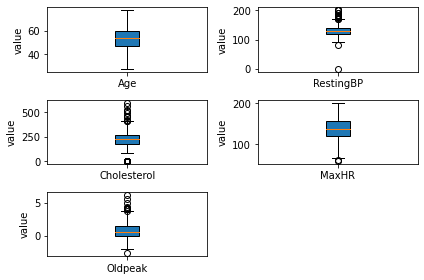

In [ ]:
#Outliers finding by box plot:
heart_df_int = heart_df.filter(['Age','RestingBP','Cholesterol','MaxHR','Oldpeak'], axis=1)
for item in heart_df_int:
    plt.subplot(3,2,list(heart_df_int).index(item)+1)
    plt.boxplot(heart_df_int[item], patch_artist=True, labels = [item])
    plt.ylabel("value")
plt.tight_layout()
plt.show()
#Outliers will not be deleted as they are genuine values only old peak values<0 will be deleted

In [ ]:
#Outliers detection and removal for old peak (deleattind data les than 0)
heart_df_out = heart_df.loc[(heart_df.Oldpeak >= 0) & (heart_df.Oldpeak< 6.5)]
heart_df_out.min()

Age                   28
Sex                    F
ChestPainType        ASY
RestingBP              0
Cholesterol            0
FastingBS              0
RestingECG           LVH
MaxHR                 60
ExerciseAngina         N
Oldpeak          0.00000
ST_Slope            Down
HeartDisease           0
dtype: object

**6)Data Post-Profiling**

In [ ]:
profile = ProfileReport(heart_df_out)
profile.to_file(output_file='Post_Profiling_Report.html')
print('Accomplished!')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Accomplished!


**Observations**


**7) Ex[ploratory Data Analysis**

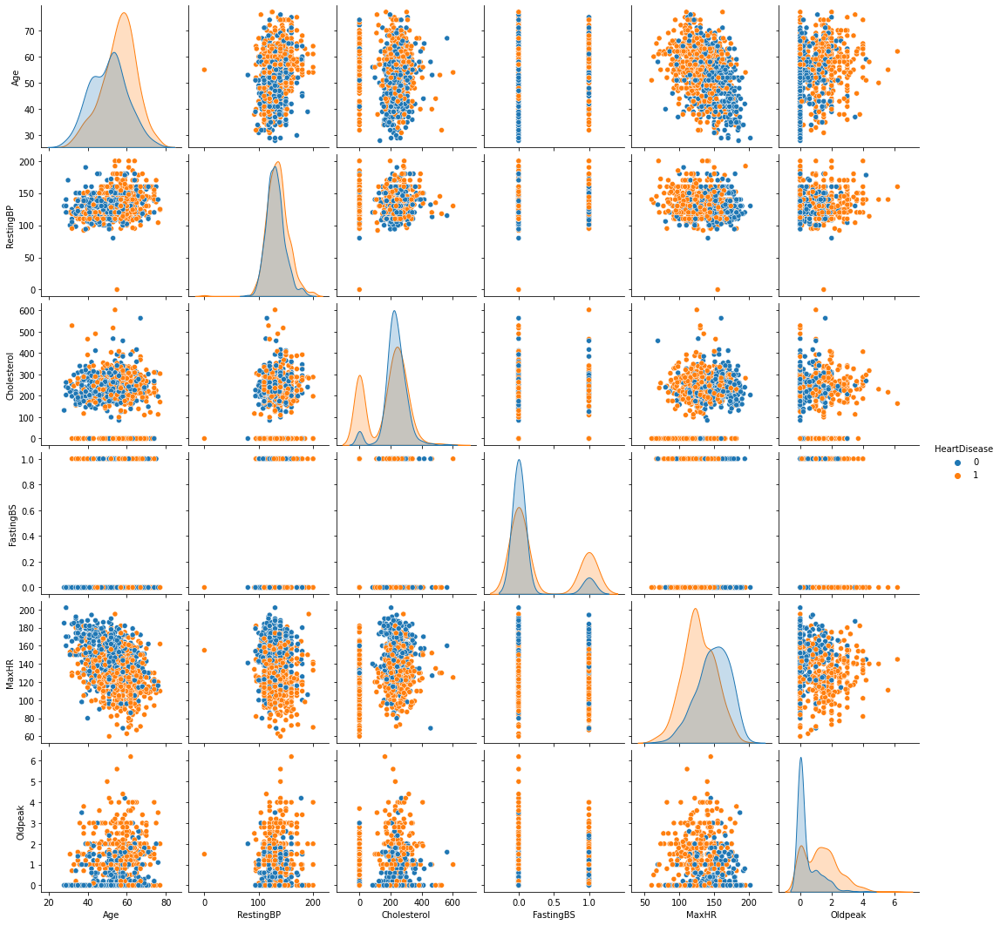

In [ ]:
sns.pairplot(heart_df_out,hue='HeartDisease')

In [ ]:
heart_df_out.skew()#-0.5 to 0.5 is acceptable #-0.5 t0 -1 or 0.5 to 1 is acceptale


Age            -0.19400
RestingBP       0.16728
Cholesterol    -0.63909
FastingBS       1.30135
MaxHR          -0.13890
Oldpeak         1.13882
HeartDisease   -0.20696
dtype: float64

In [ ]:
heart_df_out['FastingBS']=np.log(heart_df_out['FastingBS']+1)
heart_df_out['Oldpeak']=np.log(heart_df_out['Oldpeak']+1) 

In [ ]:
heart_df_out.skew()

Age            -0.19400
RestingBP       0.16728
Cholesterol    -0.63909
FastingBS       1.30135
MaxHR          -0.13890
Oldpeak         0.39093
HeartDisease   -0.20696
dtype: float64

Text(0.5, 1.0, 'Correlation between features')

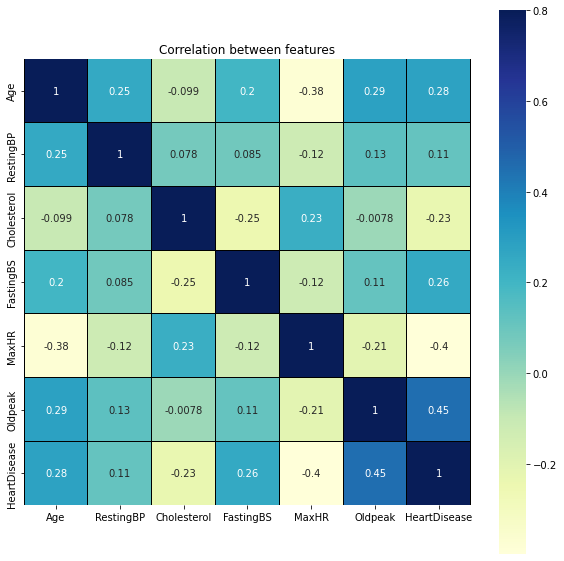

In [ ]:
corr = heart_df_out.corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='YlGnBu',linecolor ='black')
plt.title('Correlation between features')

**Observation**

*   Negative corelation between maxHR and HeartDisease
*   Negative corelation between maxHR and Age
*   Negative corelation between Cholesterol and HeartDisease
*   Negative corelation between FastingBS and Cholesterol





array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f38f03d9290>,
      dtype=object)

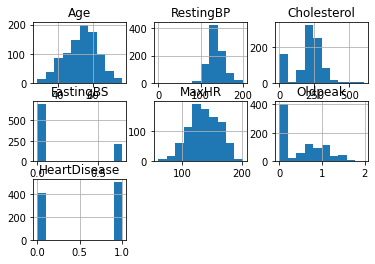

In [ ]:
heart_df_out.hist()

In [ ]:
#How many people suffering from HeartDisease
heart_df_out.HeartDisease.value_counts(dropna=False)

1    499
0    406
Name: HeartDisease, dtype: int64

1    499
0    406
Name: HeartDisease, dtype: int64


Text(0.5, 1.0, 'Haert disease and no heartdisease Ratio')

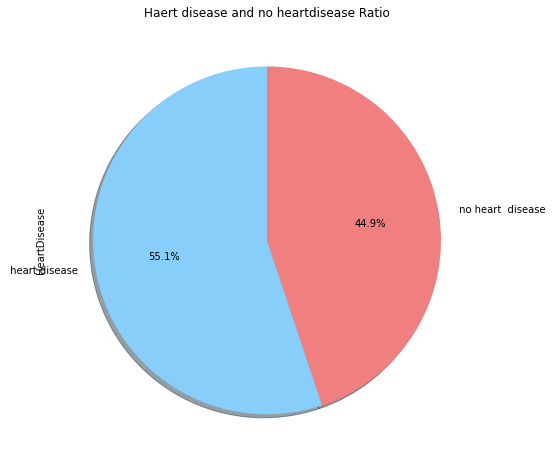

In [ ]:
#plotting pi chart for how many percentage of people suffering from heartdisease
figure=plt.figure(figsize=[10,8])
count=heart_df_out.HeartDisease.value_counts(dropna=False)
print(count)
mylabels=[' heart disease',' no heart  disease']
colors=[ 'lightskyblue','lightcoral']
count.plot.pie(labels=mylabels, colors=colors,autopct='%1.1f%%', shadow=True, startangle=90)
plt.title("Haert disease and no heartdisease Ratio")

Sex
F     50
M    449
Name: HeartDisease, dtype: int64


Text(0.5, 1.0, 'Male and female having Heart Disease')

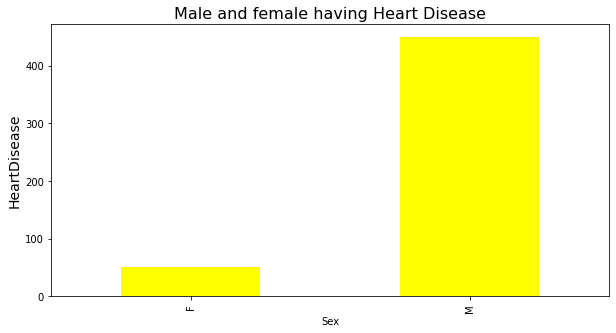

In [ ]:
#How many males and female having HeartDisease
figure = plt.figure(figsize=[10, 5])
heart_df_out.groupby(by='Sex')['HeartDisease'].sum().plot.bar(color='yellow')
print(heart_df_out.groupby(by='Sex')['HeartDisease'].sum())
plt.ylabel(ylabel='HeartDisease', size=14)
plt.title(label='Male and female having Heart Disease', size=16)

Sex  HeartDisease
F    0               143
     1                50
M    0               263
     1               449
dtype: int64


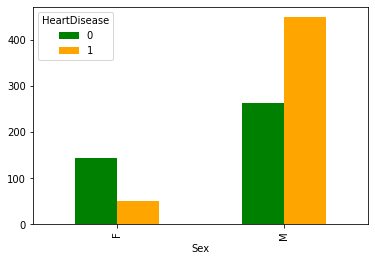

In [ ]:
#How many male and females have heartdisease or no heartdisease
count1=heart_df_out.groupby(['Sex','HeartDisease']).size()
print(count1)
heart_df_out.groupby(['Sex','HeartDisease']).size().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange", "indianred"])

Text(0.5, 1.0, 'Age Distribution')

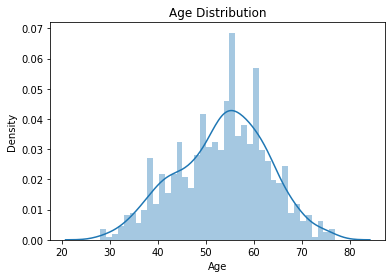

In [ ]:
#age distribution in dataset
sns.distplot(heart_df_out["Age"],kde=True, bins=40)
plt.title("Age Distribution")

Text(0.5, 1.0, 'HeartDisease & Age')

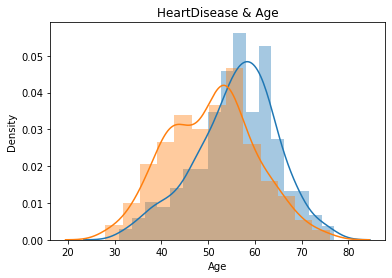

In [ ]:
#age and heartdisease relationship
sns.distplot(heart_df_out[heart_df_out["HeartDisease"]==1]["Age"])#color blue
sns.distplot(heart_df_out[heart_df_out["HeartDisease"]==0]["Age"])#color orange
plt.title("HeartDisease & Age")

Text(0.5, 1.0, 'HeartDisease & Cholesterol ')

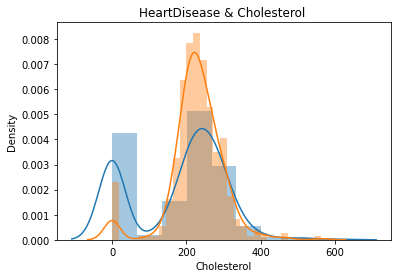

In [ ]:
#age and heartdisease relationship
sns.distplot(heart_df_out[heart_df_out["HeartDisease"]==1]["Cholesterol"])#color blue
sns.distplot(heart_df_out[heart_df_out["HeartDisease"]==0]["Cholesterol"])#colr orange
plt.title("HeartDisease & Cholesterol ")
#cholestrol levels where heartdisease is 1
#cholestrol levels where heartdisease is 1

ASY    496
NAP    203
ATA    173
TA      46
Name: ChestPainType, dtype: int64


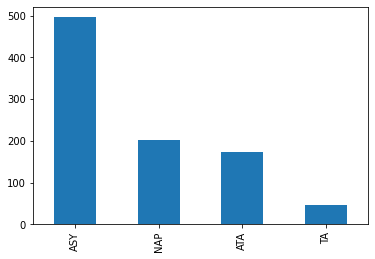

In [ ]:

count_chestpain=heart_df.ChestPainType.value_counts()
print(count_chestpain)
count_chestpain=heart_df.ChestPainType.value_counts().plot.bar()

ChestPainType  HeartDisease
ASY            0               104
               1               385
ATA            0               149
               1                24
NAP            0               127
               1                71
TA             0                26
               1                19
dtype: int64


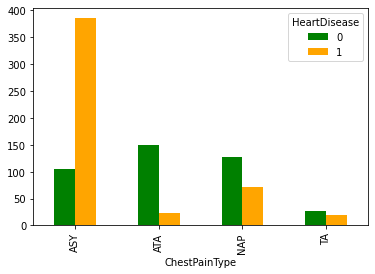

In [ ]:
count_chestpain1=heart_df_out.groupby(['ChestPainType','HeartDisease']).size()
print(count_chestpain1)
heart_df_out.groupby(['ChestPainType','HeartDisease']).size().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange", "indianred"])

0    704
1    214
Name: FastingBS, dtype: int64


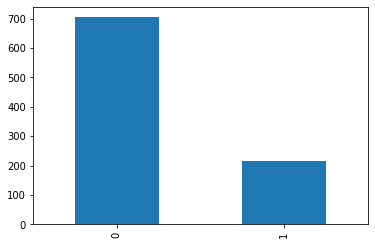

In [ ]:
count_FastingBS=heart_df.FastingBS.value_counts()
print(count_FastingBS)
count_FastingBS=heart_df.FastingBS.value_counts().plot.bar()

FastingBS  HeartDisease
0.00000    0               362
           1               337
0.69315    0                44
           1               162
dtype: int64


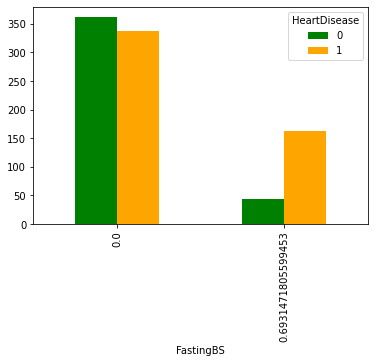

In [ ]:
count_FastingBS1=heart_df_out.groupby(['FastingBS','HeartDisease']).size()
print(count_FastingBS1)
heart_df_out.groupby(['FastingBS','HeartDisease']).size().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange", "indianred"])

Normal    552
LVH       188
ST        178
Name: RestingECG, dtype: int64


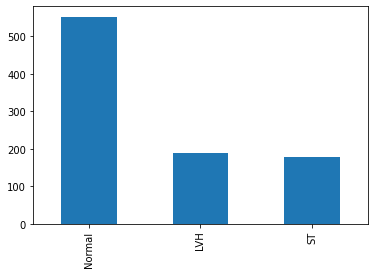

In [ ]:
count_RestingECG=heart_df.RestingECG.value_counts()
print(count_RestingECG)
count_RestingECG=heart_df.RestingECG.value_counts().plot.bar()

RestingECG  HeartDisease
LVH         0                82
            1               105
Normal      0               265
            1               280
ST          0                59
            1               114
dtype: int64


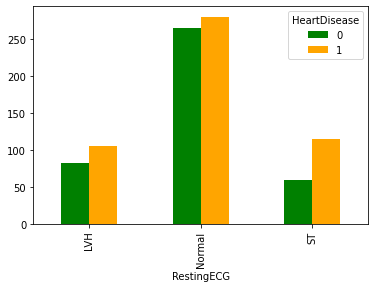

In [ ]:
count_RestingECG1=heart_df_out.groupby(['RestingECG','HeartDisease']).size()
print(count_RestingECG1)
heart_df_out.groupby(['RestingECG','HeartDisease']).size().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange", "indianred"])

N    547
Y    371
Name: ExerciseAngina, dtype: int64


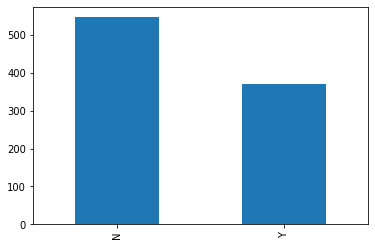

In [ ]:
count_ExerciseAngina=heart_df.ExerciseAngina.value_counts()
print(count_ExerciseAngina)
count_ExerciseAngina=heart_df.ExerciseAngina.value_counts().plot.bar()

ExerciseAngina  HeartDisease
N               0               351
                1               186
Y               0                55
                1               313
dtype: int64


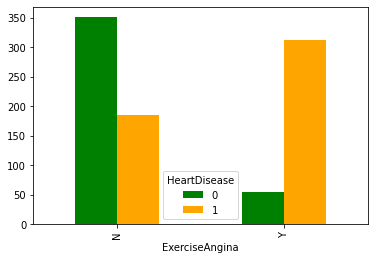

In [ ]:
count_ExerciseAngina1=heart_df_out.groupby(['ExerciseAngina','HeartDisease']).size()
print(count_ExerciseAngina1)
heart_df_out.groupby(['ExerciseAngina','HeartDisease']).size().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange", "indianred"])

Flat    460
Up      395
Down     63
Name: ST_Slope, dtype: int64


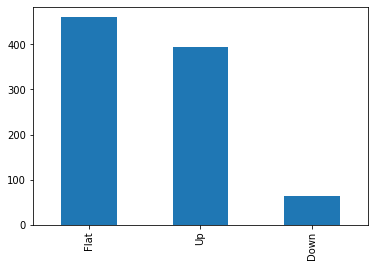

In [ ]:
count_ST_Slope=heart_df.ST_Slope.value_counts()
print(count_ST_Slope)
count_ST_Slope=heart_df.ST_Slope.value_counts().plot.bar()

ST_Slope  HeartDisease
Down      0                14
          1                47
Flat      0                79
          1               376
Up        0               313
          1                76
dtype: int64


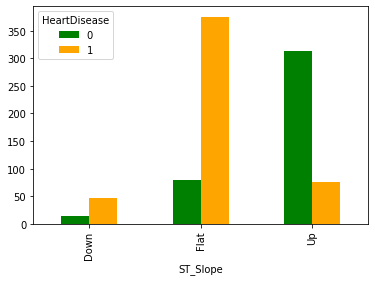

In [ ]:
count_ST_Slope1=heart_df_out.groupby(['ST_Slope','HeartDisease']).size()
print(count_ST_Slope1)
heart_df_out.groupby(['ST_Slope','HeartDisease']).size().unstack(level=-1).plot(kind='bar',stacked=False, color=["green", "orange", "indianred"])

**Observations from overall EDA:**

*   patients with Heart Disease count is **499(55.1%)**
*   patients with No  Heart Disease count is **406(44.9%)**
*   In overall male patients,there are large number of males who are having   Heart Disease
*   In age distribution of dataset most of the people belog to **age 50-60**.
*   Maximum heart disease patients lies between **50-60**.
*   People **having chloestrol level around 200** are highly suffering from heart disease
*   Most of the people having **'ASY'**Type of Cheast pain.
*   Most of the people having **'ASY'** Type of Cheast pain having heart disease.
*   Most of the people having **'0' Fasting_BS**
*   Most of the people having **'0' fasting_BS** having heart disease.
*   Most of the people having **'Normal' Resting_ECG.**
*   Most of the people having **'Normal' Resting_ECG** having heart disease.
*   Most of the people having **'No' ExerciseAngina.**
*   Most of the people having **'YES'ExerciseAngina** having heart disease.
*   Most of the people having **'Flat' ST_Slope.**
*   Most of the people having  **'Flat' ST_Slope** having heart disease.













**8) Seperation categorical and Numerical column**

In [ ]:
heart_df_int.columns

Index(['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak'], dtype='object')

In [ ]:
heart_df_out.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [ ]:
numeric_cols = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']
cat_cols = list(set(heart_df_out.columns) - set(numeric_cols) - {'HeartDisease'})
cat_cols.sort()

print(numeric_cols)
print(cat_cols)

['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']
['ChestPainType', 'ExerciseAngina', 'FastingBS', 'RestingECG', 'ST_Slope', 'Sex']


**9) Dummification of categorical Data**

In [ ]:
heart_df_dummy = pd.get_dummies(heart_df_out,columns=['ChestPainType', 'ExerciseAngina', 'FastingBS', 'RestingECG', 'ST_Slope', 'Sex'], drop_first=True)

heart_df_dummy.head(5)

,Age,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,ExerciseAngina_Y,FastingBS_0.6931471805599453,RestingECG_Normal,RestingECG_ST,ST_Slope_Flat,ST_Slope_Up,Sex_M
0,40,140,289,172,0.00000,0,1,0,0,0,0,1,0,0,1,1
1,49,160,180,156,0.69315,1,0,1,0,0,0,1,0,1,0,0
2,37,130,283,98,0.00000,0,1,0,0,0,0,0,1,0,1,1
3,48,138,214,108,0.91629,1,0,0,0,1,0,1,0,1,0,0
4,54,150,195,122,0.00000,0,0,1,0,0,0,1,0,0,1,1


**10) Data Preparation**

In [ ]:
X = heart_df_dummy.drop('HeartDisease',axis = 1)
y = heart_df_dummy['HeartDisease']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 42, stratify = y)

print('Training Data Shape:', X_train.shape, y_train.shape)
print('Testing Data Shape:', X_test.shape, y_test.shape)

Training Data Shape: (814, 15) (814,)
Testing Data Shape: (91, 15) (91,)


**11)Standadization**

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.transform (X_test)

**12) Logistic Regression (Baseline Model)**

In [ ]:
logreg = LogisticRegression()
logreg.fit(X_train,y_train)

LogisticRegression()

**13) Using Trained Model for Prediction**

In [ ]:
#predicting on train data
y_pred_train = logreg.predict(X_train)

#predicting on test data
y_pred_test = logreg.predict(X_test)

In [ ]:
#Logistic regression models are instantiated and fit the same way, and the .coef_ attribute is also used to view the model’s coefficients. 
#Note: you will need to use .coef_[0] for logistic regression to put it into a dataframe.)
log_odds = logreg.coef_[0]
pd.DataFrame(log_odds, 
             X.columns, 
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
ST_Slope_Flat,0.62412
Sex_M,0.61421
ExerciseAngina_Y,0.39176
FastingBS_0.6931471805599453,0.35892
Oldpeak,0.31996
Age,0.18894
RestingBP,0.16238
RestingECG_Normal,-0.08001
MaxHR,-0.08471
RestingECG_ST,-0.10040


In [ ]:
#Because of the logit function, logistic regression coefficients represent the log odds that an observation is in the target class (“1”) given the values of its X variables.
# Thus, these log odd coefficients need to be converted to regular odds in order to make sense of them.
# Happily, this is done by simply exponentiating the log odds coefficients, which you can do with np.exp()

odds = np.exp(logreg.coef_[0])
pd.DataFrame(odds, 
             X.columns, 
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
ST_Slope_Flat,1.86660
Sex_M,1.84819
ExerciseAngina_Y,1.47958
FastingBS_0.6931471805599453,1.43178
Oldpeak,1.37707
Age,1.20797
RestingBP,1.17631
RestingECG_Normal,0.92311
MaxHR,0.91878
RestingECG_ST,0.90447


**14)Logistic Regression Model Evaluation**

                         Predicted NO Heart Disease  Predicted Heart Disease
Actual NO Heart Disease                          36                        5
Actual Heart Disease                              4                       46


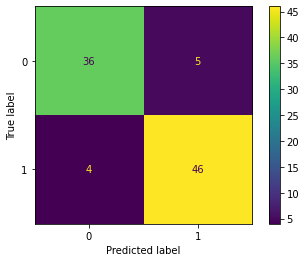

In [ ]:
#Confusion Matrix
confusion_matrix1 = pd.DataFrame(confusion_matrix(y_test, y_pred_test))
confusion_matrix1.index = ['Actual NO Heart Disease','Actual Heart Disease']
confusion_matrix1.columns = ['Predicted NO Heart Disease','Predicted Heart Disease']
print(confusion_matrix1)
plot_confusion_matrix(logreg, X_test, y_test)

**Observations**

True Positive(TP) = 46

True Negative(TN) = 36

False Positive(FP) = 5

False Negative(FN) = 4 

In [ ]:
#Accuracy
print('Accuracy score for test data is:', accuracy_score(y_test,y_pred_test))

Accuracy score for test data is: 0.9010989010989011


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
print('\nClassification Report')
print(classification_report(y_test, y_pred_test))


Classification Report
              precision    recall  f1-score   support

           0       0.90      0.88      0.89        41
           1       0.90      0.92      0.91        50

    accuracy                           0.90        91
   macro avg       0.90      0.90      0.90        91
weighted avg       0.90      0.90      0.90        91



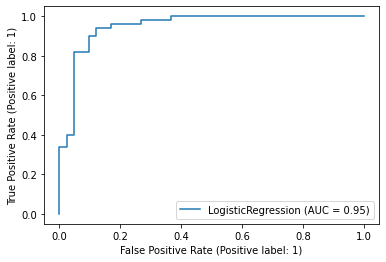

In [ ]:
plot_roc_curve(logreg, X_test, y_test)

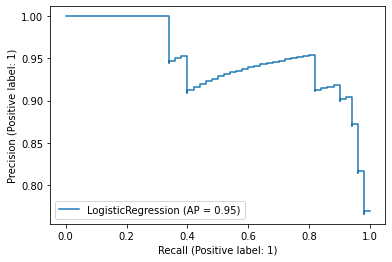

In [ ]:
plot_precision_recall_curve(logreg, X_test, y_test)

**15) Conclusion**


I studied in breifly about the data, its characteristics and its distribution.

I explored some questions related to Heart Disease.

I investigated in depth about the features which to retain and which to discard.

I performed model training.

I observed metrics for our prediction.

This model now can help us in identifying Heart Disease on the basis of given features.

#Decision Tree algorithum:

In [ ]:
from sklearn.tree import DecisionTreeClassifier

Data preparation and standardidation is already done

In [ ]:
X_train.shape
y_train.shape

(814,)

In [ ]:
X_test.shape
y_test.shape

(91,)

In [ ]:
dtc=DecisionTreeClassifier(criterion='entropy',random_state=123)
dtc.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', random_state=123)

In [ ]:
#predicting on train data
y_pred_train_dtc = dtc.predict(X_train)

#predicting on test data
y_pred_test_dtc = dtc.predict(X_test)

In [ ]:
#Confusion Matrix
cm=confusion_matrix(y_test,y_pred_test_dtc)
print(cm)

[[33  8]
 [ 6 44]]


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
print('\nClassification Report')
print(classification_report(y_test, y_pred_test_dtc))


Classification Report
              precision    recall  f1-score   support

           0       0.85      0.80      0.83        41
           1       0.85      0.88      0.86        50

    accuracy                           0.85        91
   macro avg       0.85      0.84      0.84        91
weighted avg       0.85      0.85      0.85        91



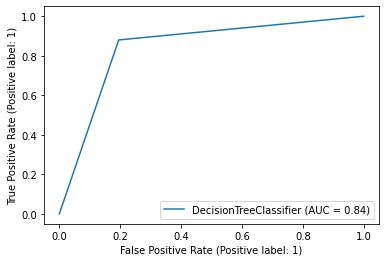

In [ ]:
plot_roc_curve(dtc, X_test, y_test)

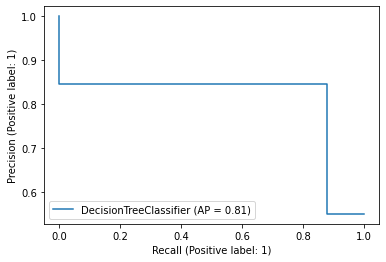

In [ ]:
plot_precision_recall_curve(dtc, X_test, y_test)

**Obsevation:**
Accuracy of Decision Tree Algorithum is 85 percent.

#Random Forest Agorithum:

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc=RandomForestClassifier(n_estimators=50,criterion='entropy',random_state=123)
rfc.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=123)

In [ ]:
y_pred_test_rfc=rfc.predict(X_test)

In [ ]:
#Confusion Matrix
cm1=confusion_matrix(y_test,y_pred_test_rfc)
print(cm1)

[[35  6]
 [ 4 46]]


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
print('\nClassification Report')
print(classification_report(y_test, y_pred_test_rfc))


Classification Report
              precision    recall  f1-score   support

           0       0.90      0.85      0.88        41
           1       0.88      0.92      0.90        50

    accuracy                           0.89        91
   macro avg       0.89      0.89      0.89        91
weighted avg       0.89      0.89      0.89        91



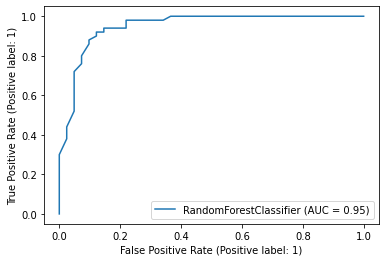

In [ ]:
plot_roc_curve(rfc, X_test, y_test)

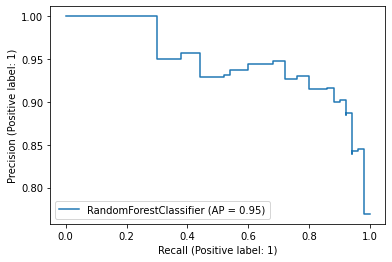

In [ ]:
plot_precision_recall_curve(rfc, X_test, y_test)

**Obsevation:** Accuracy of Random Forest Algorithum is 89 percent.

#Random Forest Algorithum with PCA

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.23413222, 0.11087727, 0.08702792, 0.08233975, 0.07415994])

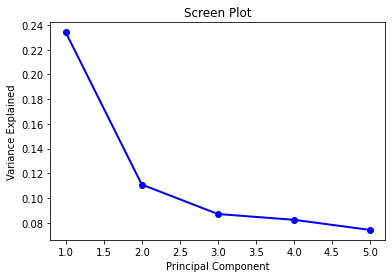

In [ ]:

pc_value=np.arange(pca.n_components_)+1
plt.plot(pc_value,pca.explained_variance_ratio_,'o-',linewidth=2,color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc_pca=RandomForestClassifier(n_estimators=50,criterion='entropy',random_state=123)
rfc_pca.fit(X_train_pca,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=123)

In [ ]:
y_pred_test_rfc_pca=rfc_pca.predict(X_test_pca)

In [ ]:
#Confusion Matrix
cm_rfc_pca=confusion_matrix(y_test,y_pred_test_rfc_pca)
print(cm_rfc_pca)

[[34  7]
 [ 3 47]]


In [ ]:
#Classification Report
from sklearn.metrics import classification_report
print('\nClassification Report')
print(classification_report(y_test, y_pred_test_rfc_pca))


Classification Report
              precision    recall  f1-score   support

           0       0.92      0.83      0.87        41
           1       0.87      0.94      0.90        50

    accuracy                           0.89        91
   macro avg       0.89      0.88      0.89        91
weighted avg       0.89      0.89      0.89        91



**Obsevation:** Accuracy of Random Forest Algorithum with Principal Componant Analysis is 89 percent

#Navie Bayes Algorithum

In [ ]:
from sklearn .naive_bayes import GaussianNB


In [ ]:
X_train.shape
X_test.shape

(91, 15)

In [ ]:
y_train.shape
y_test.shape

(91,)

In [ ]:
Navie_bayes_classification= GaussianNB()
Navie_bayes_classification.fit(X_train,y_train)
y_pred_navie_bayes=Navie_bayes_classification.predict(X_test)

In [ ]:
cm_navie_bayes=confusion_matrix(y_test,y_pred_navie_bayes)
cm_navie_bayes

array([[36,  5],
       [ 3, 47]])

In [ ]:
ac_navie_bayes=accuracy_score(y_test,y_pred_navie_bayes)
ac_navie_bayes

0.9120879120879121

In [ ]:
print(classification_report(y_test, y_pred_navie_bayes))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90        41
           1       0.90      0.94      0.92        50

    accuracy                           0.91        91
   macro avg       0.91      0.91      0.91        91
weighted avg       0.91      0.91      0.91        91



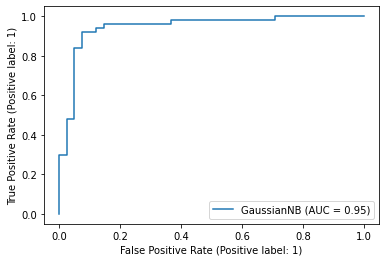

In [ ]:
plot_roc_curve(Navie_bayes_classification, X_test, y_test)

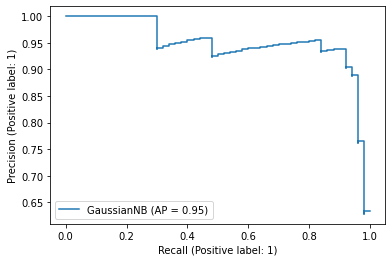

In [ ]:
plot_precision_recall_curve(Navie_bayes_classification, X_test, y_test)

#Observations of all 5 Algorithms:
1) Accuracy of Logistic Regession is:90.1%

2) Accuracy of Decision Tree is: 85%

3) Accuracy of Random Forest is:89%

4) Accuracy of Random Forest with PCA is:89%

5) Accuracy of Navie Bayes is:91%